## Trajectory-Level Feature Aggregation

In [30]:
import pandas as pd
import numpy as np
import sys

# --- 1. Define constants ---
GRID_SIZE_KM = 0.5     # 500m per grid
TIME_UNIT_HOURS = 0.5 # 30-minute time unit

# --- 2. Load data ---
print("Start loading data 'all_stop_move_stop_sequences.parquet'...")
try:
    df = pd.read_parquet("all_stop_move_stop_sequences.parquet")
    print("Data loaded successfully.")
except FileNotFoundError:
    print("Error: 'all_stop_move_stop_sequences.parquet' not found.")
    sys.exit(1)

# --- 3. Sort by trajectory ID and time ---
print("Sorting by global_seq_id and t...")
df = df.sort_values(by=['global_seq_id', 't'])

# --- 4. Compute step-wise distance (unit: grid) ---
print("Computing step-wise distances...")
dx = df.groupby('global_seq_id')['x'].diff()
dy = df.groupby('global_seq_id')['y'].diff()
df['step_dist_units'] = np.sqrt(dx**2 + dy**2).fillna(0)

# --- 5. Group and aggregate ---
print("Grouping by global_seq_id and aggregating...")
grouped = df.groupby('global_seq_id')

# 5a. Aggregate numeric statistics
traj_df = grouped.agg(
    traj_num=('x', 'size'),
    min_t=('t', 'min'),   # departure time index
    max_t=('t', 'max'),
    total_dist_units=('step_dist_units', 'sum')
)

# 5b. Aggregate trajectory coordinate list
traj_lists = grouped[['x', 'y']].apply(
    lambda g: list(zip(g['x'], g['y']))
).rename('trajectory_list')

# 5c. Merge results
traj_df = traj_df.join(traj_lists)

# --- 6. Compute derived metrics ---
print("Computing derived metrics...")

# departure_time (hours)
traj_df['departure_time'] = traj_df['min_t'] * TIME_UNIT_HOURS

# trip_time (hours)
traj_df['trip_time'] = (traj_df['max_t'] - traj_df['min_t']) * TIME_UNIT_HOURS

# trip_distance (km)
traj_df['trip_distance'] = traj_df['total_dist_units'] * GRID_SIZE_KM

# avg_dis (average step length in km)
traj_df['avg_dis'] = 0.0
mask_gt1_point = traj_df['traj_num'] > 1
traj_df.loc[mask_gt1_point, 'avg_dis'] = \
    traj_df.loc[mask_gt1_point, 'trip_distance'] / (traj_df.loc[mask_gt1_point, 'traj_num'] - 1)

# avg_speed (km/h)
traj_df['avg_speed'] = 0.0
mask_gt0_time = traj_df['trip_time'] > 0
traj_df.loc[mask_gt0_time, 'avg_speed'] = \
    traj_df.loc[mask_gt0_time, 'trip_distance'] / traj_df.loc[mask_gt0_time, 'trip_time']

# trip_length (OD straight-line distance in km)
traj_df['trip_length'] = traj_df['trajectory_list'].apply(
    lambda traj: np.linalg.norm(
        np.array(traj[-1]) - np.array(traj[0])
    ) * GRID_SIZE_KM
)

# --- 7. Clean columns and reorder ---
print("Cleaning intermediate columns and reordering...")
traj_df = traj_df.drop(columns=['min_t', 'max_t', 'total_dist_units'])

# Reset index to bring global_seq_id back as a column
traj_df = traj_df.reset_index()

# Final column order
final_columns = [
    'global_seq_id',
    'trajectory_list',
    'departure_time',
    'trip_distance',
    'trip_time',
    'trip_length',
    'avg_dis',
    'avg_speed'
]
traj_df = traj_df[final_columns]

# Remove unrealistic trajectories
traj_df = traj_df[traj_df['avg_speed'] < 100].copy()

# --- 8. Save results ---
output_parquet = 'aggregated_trajectories_with_list.parquet'
print(f"Saving results to {output_parquet}...")
traj_df.to_parquet(output_parquet, index=False)

print("\n--- Processing complete ---")
print("Aggregated trajectory data (first 5 rows):")
print(traj_df.head())
print(f"\nTotal trajectories: {len(traj_df)}")

Start loading data 'all_stop_move_stop_sequences.parquet'...
Data loaded successfully.
Sorting by global_seq_id and t...
Computing step-wise distances...
Grouping by global_seq_id and aggregating...
Computing derived metrics...
Cleaning intermediate columns and reordering...
Saving results to aggregated_trajectories_with_list.parquet...

--- Processing complete ---
Aggregated trajectory data (first 5 rows):
   global_seq_id                                    trajectory_list  \
0              1                     [(81, 89), (76, 86), (75, 82)]   
1              2          [(76, 83), (77, 86), (79, 106), (76, 85)]   
2              3           [(67, 85), (72, 85), (74, 83), (67, 85)]   
3              4                     [(67, 84), (68, 79), (87, 72)]   
4              5  [(86, 73), (77, 76), (67, 85), (76, 84), (129,...   

   departure_time  trip_distance  trip_time  trip_length    avg_dis  avg_speed  
0            11.0       4.977029        1.5     4.609772   2.488514   3.318019  


## Trajectory Feature Construction and Privacy Budget Assignment

In [31]:
import pandas as pd
import numpy as np
import os

# ------------------------------
# 1. Load parquet file
# ------------------------------
df = pd.read_parquet("aggregated_trajectories_with_list.parquet")

# ------------------------------
# 2. Filter out abnormal speeds
# ------------------------------
df = df[df["avg_speed"] <= 100].copy()

# ------------------------------
# 3. Extract start / end points
# ------------------------------
df["start_point"] = df["trajectory_list"].apply(
    lambda traj: tuple(traj[0]) if len(traj) > 0 else (np.nan, np.nan)
)
df["end_point"] = df["trajectory_list"].apply(
    lambda traj: tuple(traj[-1]) if len(traj) > 0 else (np.nan, np.nan)
)

# ------------------------------
# 4. Construct x_y string identifiers
# ------------------------------
df["start_xy"] = df["start_point"].apply(lambda p: f"{int(p[0])}_{int(p[1])}")
df["end_xy"]   = df["end_point"].apply(lambda p: f"{int(p[0])}_{int(p[1])}")

# ------------------------------
# 5. Load grid-level privacy mean scores
# ------------------------------
privacy_df = pd.read_csv("grid_privacy_scores.csv")

# grid_id is already in "x_y" format
privacy_map = dict(zip(privacy_df["grid_id"], privacy_df["privacy_mean"]))

# Match privacy scores for start / end locations
df["start_privacy"] = df["start_xy"].map(privacy_map).fillna(0.0)
df["end_privacy"]   = df["end_xy"].map(privacy_map).fillna(0.0)

# Original privacy budget (linear combination)
df["privacy_budget"] = (df["start_privacy"] + df["end_privacy"]) / 2.0

# ==========================================================
# 6. 🔥 Randomly sample privacy_budget
# ==========================================================
ranks = pd.Series(df["privacy_budget"].values).rank(method="average").values
p_trigger = (ranks - 1) / (len(ranks) - 1)
df["p_trigger"] = p_trigger

rng = np.random.default_rng(42)
p = df["p_trigger"].values  # range [0, 1]
scale = 1
p2 = np.clip(p * scale, 0.0, 1.0)

trigger = rng.binomial(1, p2)

alpha, beta = 2, 2
strength = rng.beta(alpha, beta, size=len(df))

df["privacy_budget"] = trigger * strength  # ensure range [0, 1]

total = len(df)
num_clean = (df["privacy_budget"] <= 1e-8).sum()
num_priv  = total - num_clean

print(f"Clean trajectories  : {num_clean} / {total} "
      f"({num_clean / total * 100:.2f}%)")

print(f"Privacy trajectories : {num_priv} / {total} "
      f"({num_priv / total * 100:.2f}%)")

# ------------------------------
# 7. Factorize start / end IDs
# ------------------------------
all_points = pd.concat([df["start_point"], df["end_point"]], axis=0)
point_ids, uniques = pd.factorize(all_points)

df["start_id"] = point_ids[: len(df)]
df["end_id"]   = point_ids[len(df):]

df["start_id_group"] = df["start_id"]
df["end_id_group"]   = df["end_id"]

print("Original max ID:", df["start_id"].max(), df["end_id"].max())
print("Grouped max ID :", df["start_id_group"].max(), df["end_id_group"].max())

# ------------------------------
# 8. Feature selection
# (privacy_budget is explicitly excluded from normalization)
# ------------------------------
keep_cols = ["departure_time"]
continuous_cols = [
    "trip_distance", "trip_time",
    "trip_length", "avg_dis", "avg_speed"
]
id_cols = ["start_id_group", "end_id_group"]

df_selected = df[keep_cols + continuous_cols + id_cols + ["privacy_budget"]]

# ------------------------------
# 9. Compute mean / std (continuous variables only)
# ------------------------------
means = df_selected[continuous_cols].mean()
stds  = df_selected[continuous_cols].std()

# ------------------------------
# 10. Z-score normalization (excluding privacy_budget)
# ------------------------------
df_norm = df_selected.copy()
df_norm[continuous_cols] = (df_norm[continuous_cols] - means) / stds

# ------------------------------
# 11. Save processed data
# ------------------------------
traj_features = df_norm.to_numpy(dtype=np.float32)
os.makedirs("./data_privacy", exist_ok=True)
np.save(os.path.join("./data_privacy", "trajectory_features.npy"), traj_features)

Clean trajectories  : 50109 / 99755 (50.23%)
Privacy trajectories : 49646 / 99755 (49.77%)
Original max ID: 16298 18534
Grouped max ID : 16298 18534


# epsilon-timestep

In [ ]:
import numpy as np
from scipy.stats import norm

def eps_per_timestep(alpha_bar, Delta_f0, delta=1e-6):
    """
    alpha_bar: (T,)  cumulative product of (1-beta_t)
    Delta_f0: scalar  point-level sensitivity
    delta: scalar
    returns: eps_t shape (T,)
    """
    alpha_bar = np.clip(alpha_bar, 1e-12, 1 - 1e-12)

    # a_t = sqrt(alpha_bar)*Delta / sqrt(1-alpha_bar)
    a_t = np.sqrt(alpha_bar) * Delta_f0 / np.sqrt(1.0 - alpha_bar)

    # eps_t = a^2/2 - a * Phi^{-1}(delta)
    eps_t = 0.5 * a_t**2 - a_t * norm.ppf(delta)
    return eps_t

def compute_alpha_bar(beta_start, beta_end, T):
    betas = np.linspace(beta_start, beta_end, T)
    alphas = 1 - betas
    alpha_bar = np.cumprod(alphas)
    return alpha_bar

def epsilon_to_timestep(epsilon, eps_t):
    """
    epsilon: scalar, target privacy budget
    eps_t: (T,), monotonically decreasing epsilon per timestep

    returns: int timestep t
    """
    epsilon = float(epsilon)

    idx = np.where(eps_t <= epsilon)[0]
    if len(idx) == 0:
        return len(eps_t) - 1
    return int(idx[0])

T = 1000
alpha_bar = compute_alpha_bar(1e-4, 0.01, T)
eps_t = eps_per_timestep(alpha_bar, Delta_f0=8.0, delta=1e-5)
print(eps_t[:5], eps_t[-5:])

# Map privacy budget to epsilon

In [33]:
def budget_to_epsilon(p, eps_min=0.5, eps_max=10.0):
    """
    p in [0,1]
    p=0 -> eps_max (weak privacy, less noise)
    p=1 -> eps_min (strong privacy, more noise)
    """
    p = np.clip(p, 0.0, 1.0)
    log_eps = (1 - p) * np.log(eps_max) + p * np.log(eps_min)
    return float(np.exp(log_eps))

# Add noise to traj

In [34]:
import numpy as np

INPUT_FILE = "aggregated_trajectories_with_list.parquet"
FEATURE_FILE = "./data_privacy/trajectory_features.npy"
OUTPUT_DIR = "./data_privacy/noise_sweep"
TARGET_LEN = 20

NOISE_LEVELS = np.linspace(0.0, 1.0, num=11) # 

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

def resample_trajectory(traj, target_len):
    try:
        traj = np.array(traj.tolist(), dtype=float)
    except Exception:
        return np.zeros((target_len, 2))

    if traj.ndim == 1:
        traj = traj.reshape(1, -1)

    cur_len, dims = traj.shape
    if cur_len == target_len:
        return traj

    t_old = np.linspace(0, 1, cur_len)
    t_new = np.linspace(0, 1, target_len)

    out = np.zeros((target_len, dims))
    for d in range(dims):
        out[:, d] = np.interp(t_new, t_old, traj[:, d])

    return out

def normalize_tensor_zscore(tensor, eps=1e-8):
    mean = tensor.mean(axis=(0, 1), keepdims=True)
    std  = tensor.std(axis=(0, 1), keepdims=True)
    tensor_norm = (tensor - mean) / (std + eps)
    stats = {"mean": mean.astype(np.float32), "std": std.astype(np.float32)}
    return tensor_norm.astype(np.float32), stats

def load_and_process_trajectories(input_file, target_len):
    print("Loading parquet data...")
    df = pd.read_parquet(input_file)
    df = df[df["avg_speed"] <= 100].copy()
    print(f"Filtered rows: {len(df)}")

    trajs = df["trajectory_list"].values
    processed = [resample_trajectory(t, target_len) for t in trajs]
    tensor = np.stack(processed).astype(np.float32)

    print(f"Trajectory tensor shape: {tensor.shape}")
    return tensor

def diffusion_forward_by_timestep(x0, timesteps, alpha_bar):
    """
    x0        : (N, L, D)  normalized trajectories
    timesteps : (N,)      integer diffusion step for each trajectory
    alpha_bar : (T,)      precomputed cumulative alpha

    return:
        x_noisy : (N, L, D)
    """
    N, L, D = x0.shape
    eps = np.random.randn(N, L, D).astype(np.float32)

    x_noisy = np.zeros_like(x0, dtype=np.float32)

    for i in range(N):
        t = int(timesteps[i])
        a = alpha_bar[t]

        x_noisy[i] = (
            np.sqrt(a) * x0[i]
            + np.sqrt(1.0 - a) * eps[i]
        )

    return x_noisy

In [ ]:
def main():
    traj = load_and_process_trajectories(INPUT_FILE, TARGET_LEN)
    traj, norm_stats = normalize_tensor_zscore(traj)

    features = np.load(FEATURE_FILE)
    base_privacy = features[:, -1]   # privacy_budget ∈ [0,1]

    T = 1000
    alpha_bar = compute_alpha_bar(1e-4, 0.01, T)

    Delta_f0 = 5.0
    eps_t = eps_per_timestep(alpha_bar, Delta_f0, delta=1e-6)
    eps_min, eps_max = eps_t[-1], eps_t[0]


    epsilon = np.array([
        budget_to_epsilon(p, eps_min, eps_max)
        for p in base_privacy
    ])

    t_base = np.array([
        epsilon_to_timestep(e, eps_t)
        for e in epsilon
    ])  # (N,)


    os.makedirs(OUTPUT_DIR, exist_ok=True)

    for nl in NOISE_LEVELS:
        print(f"\n=== Noise level {nl:.2f} ===")

        privacy_scaled = np.clip(base_privacy * nl, 0.0, 1.0)

        # privacy → epsilon
        epsilon = np.array([
            budget_to_epsilon(p, eps_min, eps_max)
            for p in privacy_scaled
        ])

        # epsilon → timestep
        t_scaled = np.array([
            epsilon_to_timestep(e, eps_t)
            for e in epsilon
        ])

        # diffusion forward
        traj_noisy = diffusion_forward_by_timestep(
            traj, t_scaled, alpha_bar
        )

        subdir = os.path.join(OUTPUT_DIR, f"noise_{nl:.2f}")
        os.makedirs(subdir, exist_ok=True)

        np.save(os.path.join(subdir, "traj.npy"), traj_noisy)

        new_features = features.copy()
        new_features[:, -1] = t_scaled
        np.save(os.path.join(subdir, "traj_features.npy"), new_features)

        print(
            f"Saved | mean timestep = {t_scaled.mean():.1f}, "
            f"max = {t_scaled.max()}, min = {t_scaled.min()}"
        )

    print("\n✔ All diffusion-LDP noise-level datasets generated.")

main()

Loading parquet data...
Filtered rows: 99755
Trajectory tensor shape: (99755, 20, 2)

=== Noise level 0.00 ===
Saved | mean timestep = 1.0, max = 1, min = 1

=== Noise level 0.10 ===
Saved | mean timestep = 1.1, max = 2, min = 1

=== Noise level 0.20 ===
Saved | mean timestep = 1.8, max = 7, min = 1

=== Noise level 0.30 ===
Saved | mean timestep = 3.1, max = 17, min = 1

=== Noise level 0.40 ===
Saved | mean timestep = 5.2, max = 38, min = 1

=== Noise level 0.50 ===
Saved | mean timestep = 8.7, max = 77, min = 1

=== Noise level 0.60 ===
Saved | mean timestep = 14.3, max = 153, min = 1

=== Noise level 0.70 ===
Saved | mean timestep = 23.4, max = 294, min = 1

=== Noise level 0.80 ===
Saved | mean timestep = 38.0, max = 515, min = 1

=== Noise level 0.90 ===
Saved | mean timestep = 59.6, max = 764, min = 1

=== Noise level 1.00 ===
Saved | mean timestep = 88.3, max = 993, min = 1

✔ All diffusion-LDP noise-level datasets generated.


## Plot Privacy Trajectories

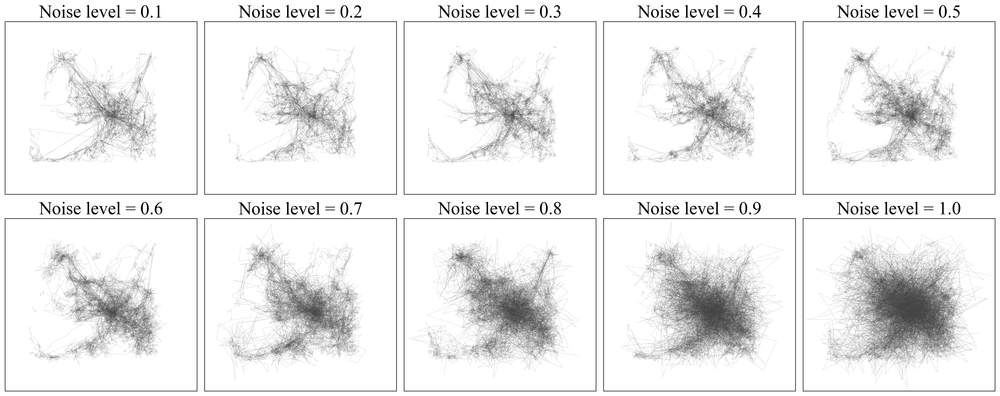

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib import rcParams
import os

rcParams["font.family"] = "serif"
rcParams["font.serif"] = ["Times New Roman", "Times", "STIXGeneral"]
rcParams["mathtext.fontset"] = "stix"


DATA_DIR = "./data_privacy/noise_sweep"


MAX_DRAW = 1000
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

all_trajs = {}
all_x, all_y = [], []

NOISE_LEVELS = np.linspace(0.1, 1.0, num=10)
for noise in NOISE_LEVELS:
    noise_dir = os.path.join(DATA_DIR, f"noise_{noise:.2f}")
    npy_file = os.path.join(noise_dir, "traj.npy")

    if not os.path.exists(npy_file):
        continue

    trajs = np.load(npy_file)

    if len(trajs) > MAX_DRAW:
        idx = np.random.choice(len(trajs), MAX_DRAW, replace=False)
        trajs = trajs[idx]

    all_trajs[noise] = trajs
    all_x.append(trajs[:, :, 0].ravel())
    all_y.append(trajs[:, :, 1].ravel())


all_x = np.concatenate(all_x)
all_y = np.concatenate(all_y)
margin = (all_x.max() - all_x.min()) * 0.02

xlim = (all_x.min() - margin, all_x.max() + margin)
ylim = (all_y.min() - margin, all_y.max() + margin)

fig, axes = plt.subplots(2, 5, figsize=(20, 8), dpi=300)
axes = axes.flatten()

for ax, noise in zip(axes, NOISE_LEVELS):
    trajs = all_trajs.get(noise)
    if trajs is None:
        ax.axis("off")
        continue

    lc = LineCollection(
        trajs,
        colors="#444444",
        linewidths=0.3,
        alpha=0.3,
        rasterized=True
    )
    ax.add_collection(lc)

    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f"Noise level = {noise:.1f}", fontsize=26)

plt.tight_layout()
plt.savefig("trajectory_privacy_tradeoff.pdf", bbox_inches="tight", dpi=300)
plt.show()

## SSIM

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from scipy.ndimage import gaussian_filter
from matplotlib.colors import LinearSegmentedColormap
import os

DATA_DIR = "./data_privacy/noise_sweep"
FEATURE_FILE = "./data_privacy/trajectory_features.npy"

GRID_SIZE = 200
SIGMA = 1.5

In [38]:
traj_real = np.load(os.path.join(DATA_DIR, "noise_0.00", "traj.npy"))
features = np.load(FEATURE_FILE)
privacy_budget = features[:, -1]

assert len(traj_real) == len(privacy_budget)

# 只选隐私轨迹
priv_idx = np.where(privacy_budget > 1e-8)[0]

print(f"Privacy trajectories: {len(priv_idx)} / {len(traj_real)}")

traj_real_priv = traj_real[priv_idx]
all_x = traj_real_priv[..., 0].reshape(-1)
all_y = traj_real_priv[..., 1].reshape(-1)

X_MIN, X_MAX = all_x.min(), all_x.max()
Y_MIN, Y_MAX = all_y.min(), all_y.max()

Privacy trajectories: 49646 / 99755


In [39]:
def generate_density_heatmap(traj_array, grid_size, mode="start", sigma=1.5):
    heatmap = np.zeros((grid_size, grid_size), dtype=np.float32)

    if mode == "start":
        pts = traj_array[:, 0, :]
    elif mode == "end":
        pts = traj_array[:, -1, :]
    else:
        raise ValueError("mode must be 'start' or 'end'")

    norm_x = (pts[:, 0] - X_MIN) / (X_MAX - X_MIN + 1e-12)
    norm_y = (pts[:, 1] - Y_MIN) / (Y_MAX - Y_MIN + 1e-12)

    gx = np.clip((norm_x * grid_size).astype(int), 0, grid_size - 1)
    gy = np.clip((norm_y * grid_size).astype(int), 0, grid_size - 1)

    np.add.at(heatmap, (gy, gx), 1)

    if sigma > 0:
        heatmap = gaussian_filter(heatmap, sigma=sigma)

    return heatmap

white_od = LinearSegmentedColormap.from_list(
    "white_od",
    ["#ffffff", "#ffb347", "#ff6a00", "#d40000", "#4b0000"]
)


===== Noise level: 0.10 =====
[start] SSIM = 0.9925


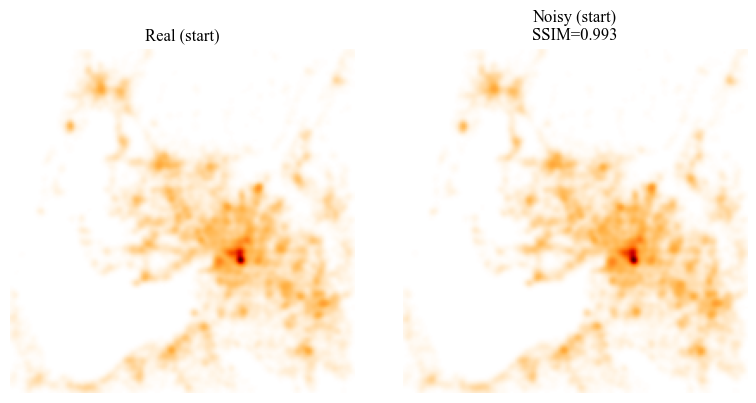


===== Noise level: 0.20 =====
[start] SSIM = 0.9894


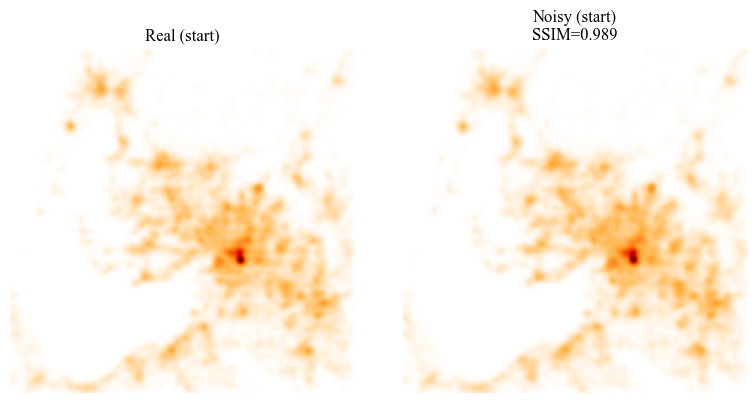


===== Noise level: 0.30 =====
[start] SSIM = 0.9770


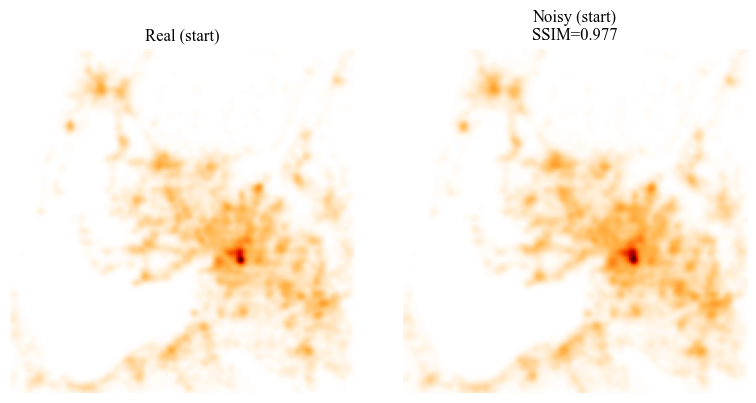


===== Noise level: 0.40 =====
[start] SSIM = 0.9444


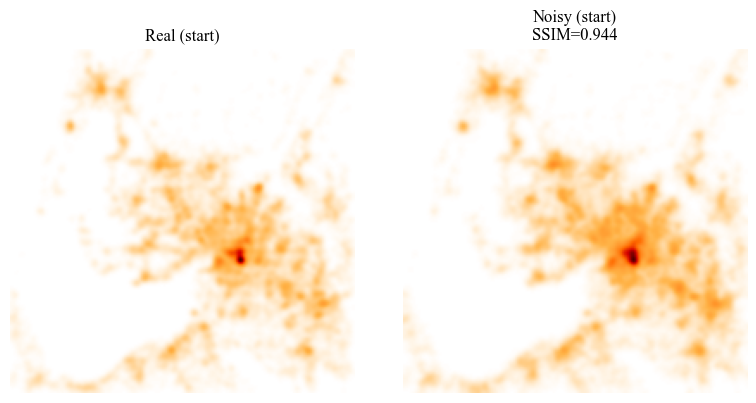


===== Noise level: 0.50 =====
[start] SSIM = 0.8995


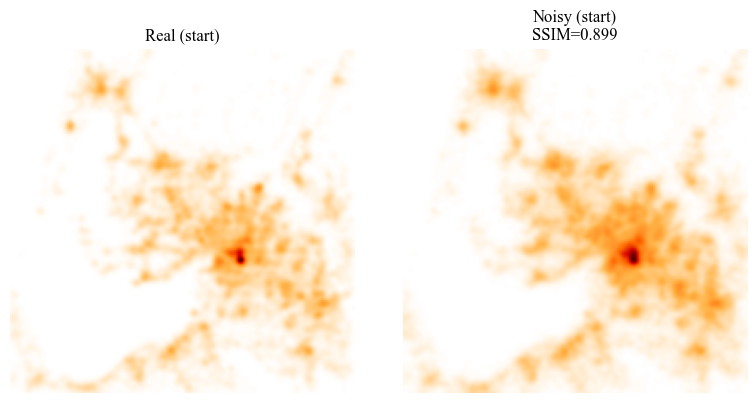


===== Noise level: 0.60 =====
[start] SSIM = 0.8344


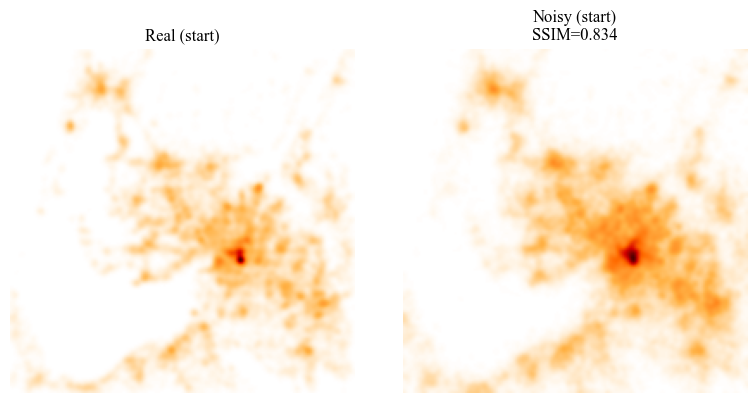


===== Noise level: 0.70 =====
[start] SSIM = 0.7605


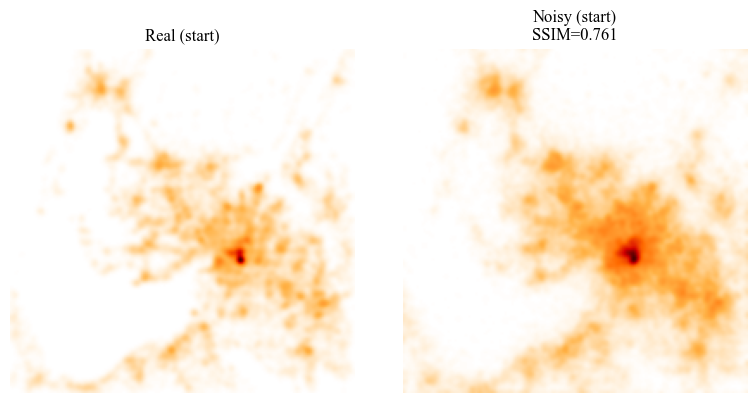


===== Noise level: 0.80 =====
[start] SSIM = 0.6737


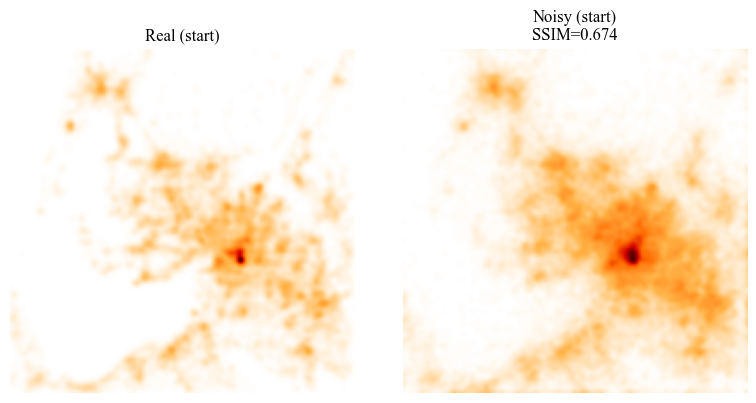


===== Noise level: 0.90 =====
[start] SSIM = 0.5843


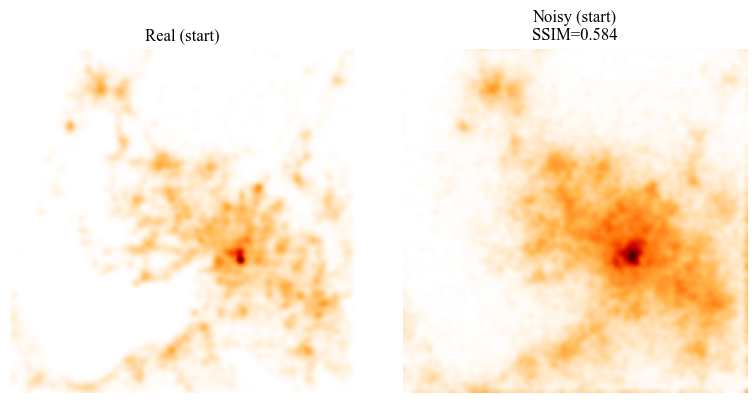


===== Noise level: 1.00 =====
[start] SSIM = 0.5072


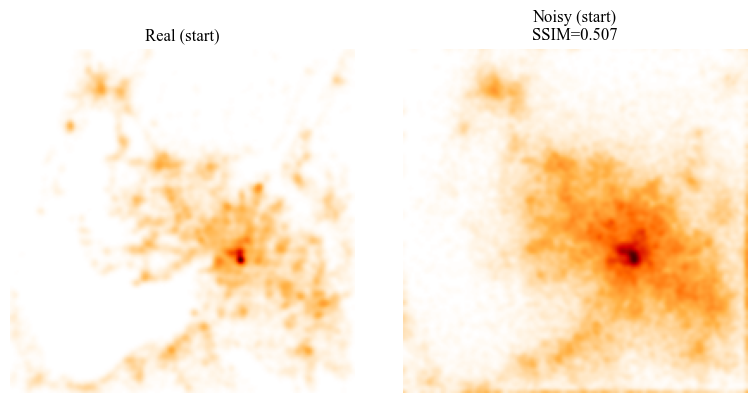

In [40]:
ssim_scores = []

for noise in NOISE_LEVELS:
    print(f"\n===== Noise level: {noise:.2f} =====")

    noise_dir = os.path.join(DATA_DIR, f"noise_{noise:.2f}")
    traj_noisy = np.load(os.path.join(noise_dir, "traj.npy"))[priv_idx]

    for mode in ["start"]:
        img_real = generate_density_heatmap(
            traj_real_priv, GRID_SIZE, mode, SIGMA
        )
        img_noisy = generate_density_heatmap(
            traj_noisy, GRID_SIZE, mode, SIGMA
        )

        img_real /= img_real.max() + 1e-12
        img_noisy /= img_noisy.max() + 1e-12

        score = ssim(img_real, img_noisy, data_range=1.0)

        ssim_scores.append({
            "noise": noise,
            "mode": mode,
            "ssim": score
        })

        print(f"[{mode}] SSIM = {score:.4f}")
        plt.figure(figsize=(8, 4))

        plt.subplot(1, 2, 1)
        plt.title(f"Real ({mode})")
        plt.imshow(img_real, cmap=white_od, origin="lower")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.title(f"Noisy ({mode})\nSSIM={score:.3f}")
        plt.imshow(img_noisy, cmap=white_od, origin="lower")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

## DTW-Privacy Correlation

In [41]:
import os
import numpy as np
import matplotlib.pyplot as plt
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean
from scipy.stats import linregress, pearsonr
import pandas as pd

DATA_DIR = "./data_privacy/noise_sweep"
FEATURE_FILE = "./data_privacy/trajectory_features.npy"

SAMPLE_SIZE = 2000
np.random.seed(42)

def compute_normalized_dtw(t1, t2):
    dist, path = fastdtw(t1, t2, dist=euclidean)
    return dist / max(len(path), 1)
traj_real = np.load(os.path.join(DATA_DIR, "noise_0.00", "traj.npy"))
features = np.load(FEATURE_FILE)

privacy_base = features[:, -1]
privacy_idx = np.where(privacy_base > 1e-8)[0]

traj_real_priv = traj_real[privacy_idx]
privacy_priv = privacy_base[privacy_idx]

print(f"Privacy trajectories: {len(privacy_idx)} / {len(traj_real)}")

Privacy trajectories: 49646 / 99755


Privacy trajectories: 49646 / 99755

=== Noise level 0.10 ===
Pearson r: 0.271, R²: 0.074, Slope: 0.195


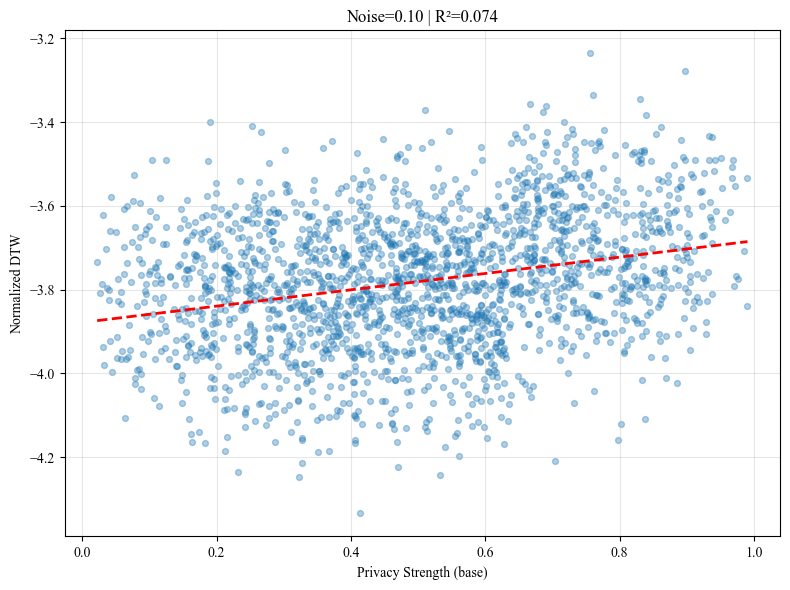


=== Noise level 0.20 ===
Pearson r: 0.639, R²: 0.408, Slope: 0.602


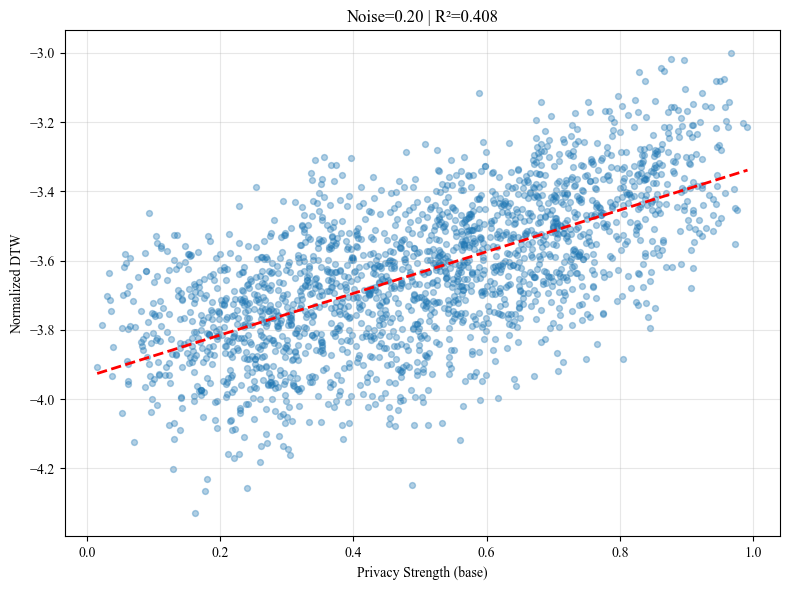


=== Noise level 0.30 ===
Pearson r: 0.855, R²: 0.732, Slope: 1.197


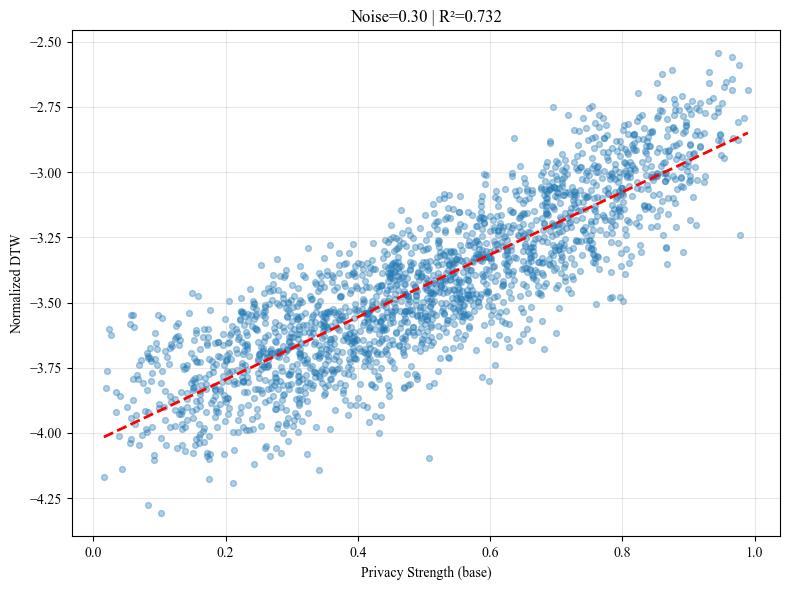


=== Noise level 0.40 ===
Pearson r: 0.932, R²: 0.868, Slope: 1.827


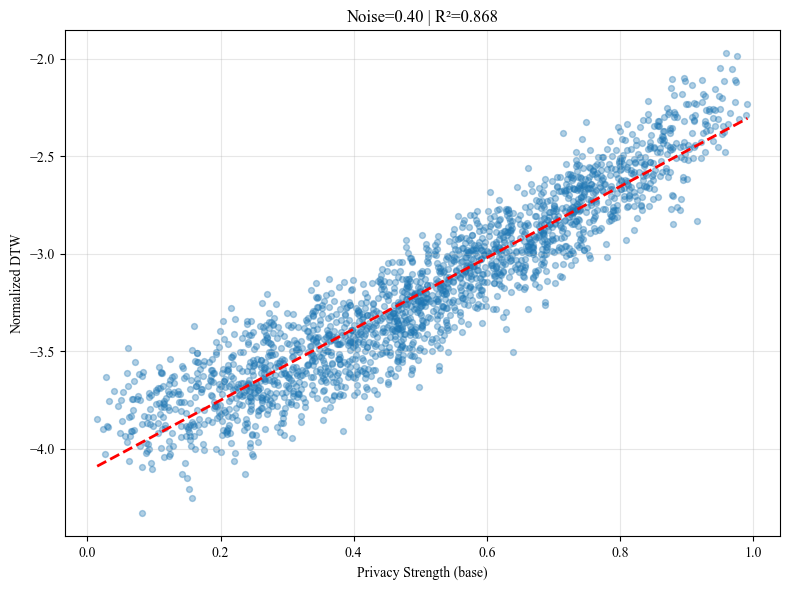


=== Noise level 0.50 ===
Pearson r: 0.960, R²: 0.921, Slope: 2.507


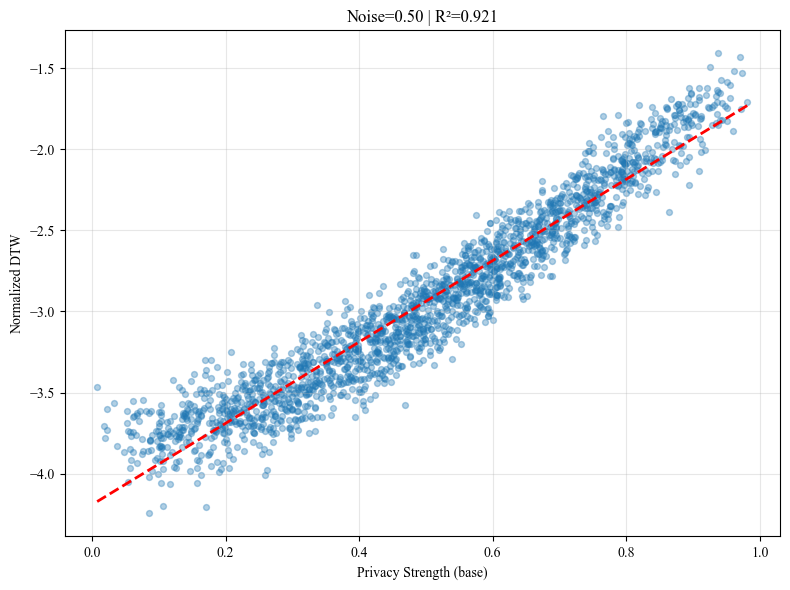


=== Noise level 0.60 ===
Pearson r: 0.975, R²: 0.951, Slope: 3.250


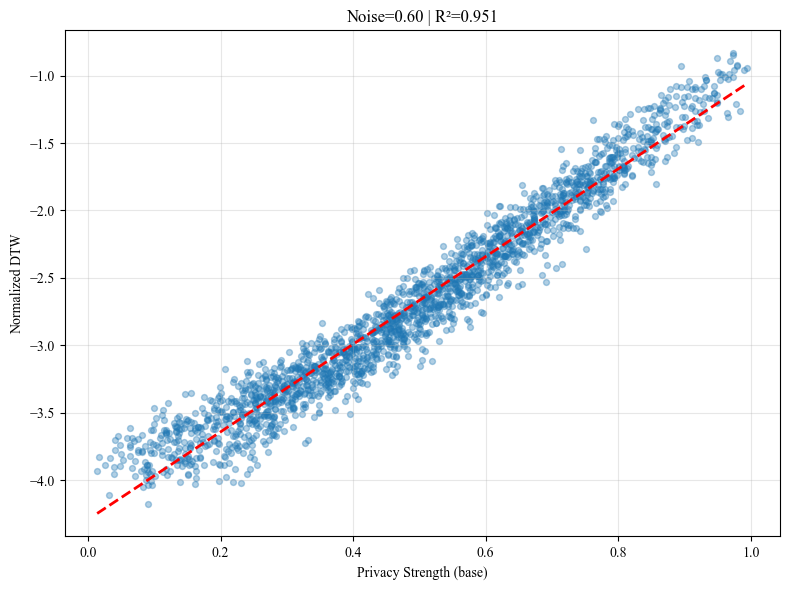


=== Noise level 0.70 ===
Pearson r: 0.982, R²: 0.963, Slope: 3.926


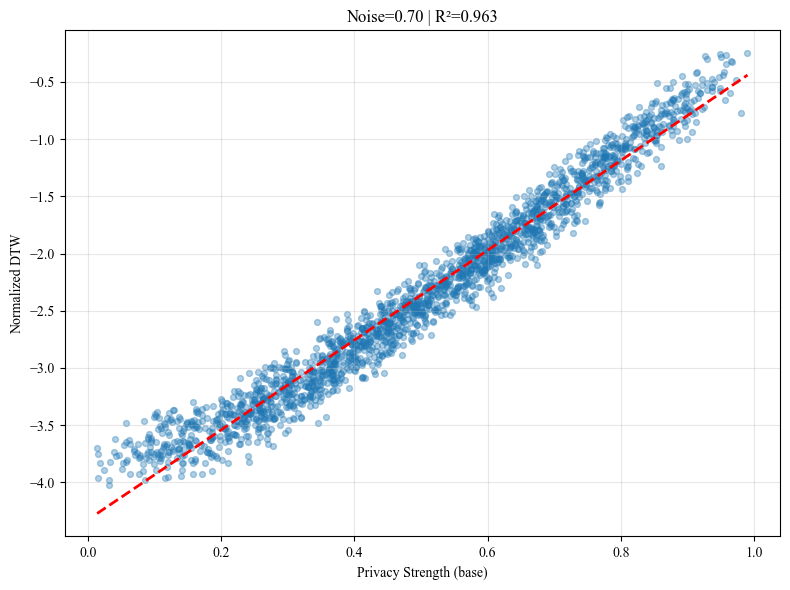


=== Noise level 0.80 ===
Pearson r: 0.988, R²: 0.975, Slope: 4.653


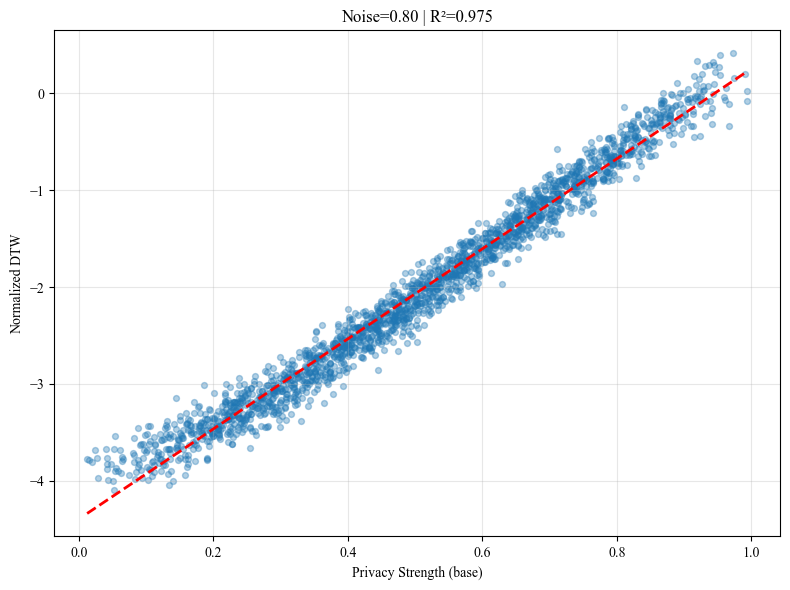


=== Noise level 0.90 ===
Pearson r: 0.989, R²: 0.977, Slope: 5.153


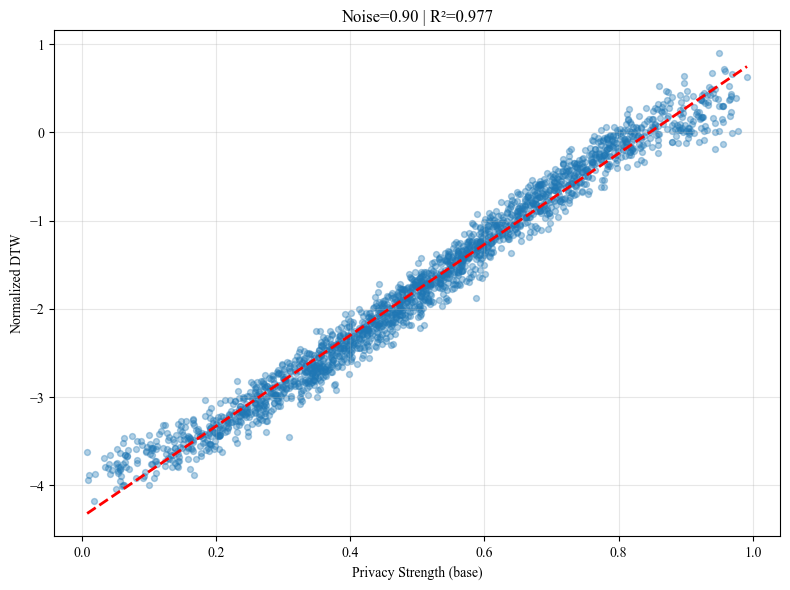


=== Noise level 1.00 ===
Pearson r: 0.988, R²: 0.976, Slope: 5.564


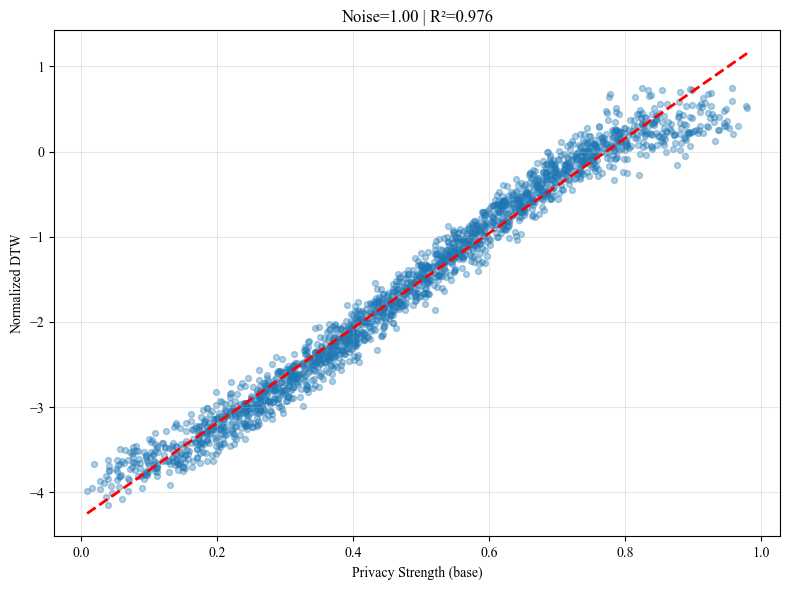

In [42]:
traj_real = np.load(os.path.join(DATA_DIR, "noise_0.00", "traj.npy"))
features = np.load(FEATURE_FILE)

privacy_base = features[:, -1]

privacy_idx = np.where(privacy_base > 1e-8)[0]
traj_real_priv = traj_real[privacy_idx]
privacy_priv = privacy_base[privacy_idx]

print(f"Privacy trajectories: {len(privacy_idx)} / {len(traj_real)}")

results = []

for noise in NOISE_LEVELS:

    print(f"\n=== Noise level {noise:.2f} ===")

    noise_dir = os.path.join(DATA_DIR, f"noise_{noise:.2f}")
    traj_noisy = np.load(os.path.join(noise_dir, "traj.npy"))
    traj_noisy_priv = traj_noisy[privacy_idx]

    n = min(SAMPLE_SIZE, len(traj_real_priv))
    sel = np.random.choice(len(traj_real_priv), n, replace=False)

    errors = []
    xs = []

    for i in sel:
        err = compute_normalized_dtw(traj_real_priv[i], traj_noisy_priv[i])
        if np.isfinite(err):
            errors.append(err)
            xs.append(privacy_priv[i])

    errors = np.array(errors)
    xs = np.array(xs)

    if noise == 0.0:
        print(f"Mean DTW (noise=0): {errors.mean():.4f}")
        results.append({
            "noise": noise,
            "slope": 0.0,
            "pearson_r": 0.0,
            "r2": 1.0,
            "dtw_mean": errors.mean()
        })
        continue

    thr = np.percentile(errors, 100)
    mask = errors < thr
    x = xs[mask]
    # y = errors[mask]
    y = np.log(errors[mask] + 1e-6)
    
    if len(x) < 10 or np.std(x) < 1e-6:
        print("Skip: insufficient variation")
        continue

    slope, intercept, r_value, _, _ = linregress(x, y)
    r2 = r_value ** 2
    r, _ = pearsonr(x, y)

    print(f"Pearson r: {r:.3f}, R²: {r2:.3f}, Slope: {slope:.3f}")

    results.append({
        "noise": noise,
        "slope": slope,
        "pearson_r": r,
        "r2": r2,
        "dtw_mean": y.mean()
    })

    plt.figure(figsize=(8, 6))
    plt.scatter(x, y, alpha=0.35, s=18)
    xx = np.linspace(x.min(), x.max(), 100)
    plt.plot(xx, slope * xx + intercept, "r--", lw=2)
    plt.xlabel("Privacy Strength (base)")
    plt.ylabel("Normalized DTW")
    plt.title(f"Noise={noise:.2f} | R²={r2:.3f}")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


In [43]:
df = pd.DataFrame(results).sort_values("noise")

## Trade-off

In [44]:
results_by_noise = {r["noise"]: r for r in results}
for s in ssim_scores:
    noise = s["noise"]
    if noise in results_by_noise:
        results_by_noise[noise]["ssim"] = s["ssim"]
    else:
        results_by_noise[noise] = {
            "noise": noise,
            "ssim": s["ssim"]
        }

In [45]:
import pandas as pd

df = pd.DataFrame(results_by_noise.values())

df = df.sort_values("slope")
df.loc[df["noise"] == 0.0, "slope"] = 0.0
print(df[["noise", "slope", "ssim"]])

   noise     slope      ssim
0    0.1  0.194872  0.992532
1    0.2  0.602120  0.989428
2    0.3  1.197435  0.977032
3    0.4  1.826926  0.944371
4    0.5  2.507165  0.899482
5    0.6  3.249901  0.834355
6    0.7  3.926004  0.760527
7    0.8  4.652655  0.673715
8    0.9  5.152921  0.584282
9    1.0  5.563876  0.507154


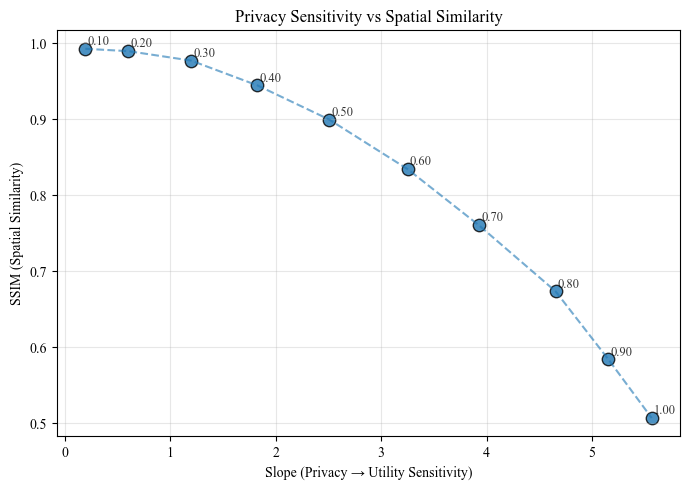

In [46]:
df_sorted = df.sort_values("slope")

plt.figure(figsize=(7, 5))

plt.scatter(
    df_sorted["slope"],
    df_sorted["ssim"],
    s=80,
    alpha=0.8,
    edgecolors="k"
)

plt.plot(
    df_sorted["slope"],
    df_sorted["ssim"],
    linestyle="--",
    alpha=0.6
)

for _, row in df_sorted.iterrows():
    plt.text(
        row["slope"] + 0.02,   
        row["ssim"] + 0.005, 
        f'{row["noise"]:.2f}',
        fontsize=9,
        alpha=0.8
    )

plt.xlabel("Slope (Privacy → Utility Sensitivity)")
plt.ylabel("SSIM (Spatial Similarity)")
plt.title("Privacy Sensitivity vs Spatial Similarity")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()